<a href="https://colab.research.google.com/github/melanieyes/stock-price-prediction/blob/master/220003_hose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import glob
import pandas as pd
import datetime
from datetime import date,timedelta
from datetime import datetime as dt
from dateutil.relativedelta import *
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, regularizers
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.layers import Dense, InputLayer, Conv1D, MaxPooling1D, Flatten, Dropout, LSTM, Dropout, LSTM
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import Sequential
import sklearn

In [ ]:
!pip install vnstock3 --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.0/93.0 kB 2.3 MB/s eta 0:00:00


In [ ]:
!git clone https://github.com/thinh-vu/vnstock

Cloning into 'vnstock'...
remote: Enumerating objects: 11910, done.
remote: Counting objects: 100% (7024/7024), done.
remote: Compressing objects: 100% (1620/1620), done.
remote: Total 11910 (delta 3269), reused 6924 (delta 3212), pack-reused 4886 (from 1)
Receiving objects: 100% (11910/11910), 55.04 MiB | 18.56 MiB/s, done.
Resolving deltas: 100% (5529/5529), done.


In [ ]:
from vnstock import *### Split the dataset into time windows to get data samples.

compdata_list = []

STOCK_LIST = ['FPT','MWG','DGC','GMD','STB','PVD','HPG','PNJ','HSG','VHM',
              'GMH', 'NO1', 'AAA', 'AAM', 'AAT', 'ABR', 'ABS', 'ABT', 'ACB',
              'ACC', 'ACL', 'AGM', 'AGR',]


for company_list in STOCK_LIST:
    try:
        # Fetch the historical data for the stock
        data = stock_historical_data(company_list, "2005-01-01", "2023-05-24")
        company_list.append(data)
    except Exception as e:
        # Print the error and skip the ticker
        print(f"Error processing {company_list}: {str(e)}")
        continue  # Move to the next ticker in the list

**Vui lòng chuyển đổi sang Vnstock3** thế hệ mới (3.1.0) với câu lệnh: `pip install vnstock3 --upgrade`.
**Từ 1/1/2025, vnstock3 sẽ được cài đặt khi sử dụng cú pháp** `pip install vnstock` **thay cho Vnstock Legacy** hiện tại.
Xem chi tiết [chuyển đổi sang vnstock3](https://vnstocks.com/docs/tai-lieu/migration-chuyen-doi-sang-vnstock3).
Phiên bản **Vnstock Legacy (0.2.9.2.3)** bạn đang sử dụng **sẽ không được nâng cấp thêm.**
Từ 7/10/2024 Vnstock giới thiệu nhóm Facebook Cộng đồng Vnstock, tham gia thảo luận tại đây: https://www.facebook.com/groups/vnstock.official

Error processing FPT: 'str' object has no attribute 'append'
Error processing MWG: 'str' object has no attribute 'append'
Error processing DGC: 'str' object has no attribute 'append'
Error processing GMD: 'str' object has no attribute 'append'
Error processing STB: 'str' object has no attribute 'append'
Error processing PVD: 'str' object has no attribute 'append'
Error processing HPG: 'str' object has no attribute 'append'
Error processing PNJ: 'str' object has no attribute 'append'
Error processing HSG: 'str' object has no attribute 'append'
Error processing VHM: 'str' object has no attribute 'append'
Error processing GMH: 'str' object has no attribute 'append'
Error processing NO1: 'str' object has no attribute 'append'
Error processing AAA: 'str' object has no attribute 'append'
Error processing AAM: 'str' object has no attribute 'append'
Error processing AAT: 'str' object has no attribute 'append'
Error processing ABR: 'str' object has no attribute 'append'
Error processing ABS: 's

In [ ]:
company = []
stock_code = ['ACB','FPT','MWG','DGC','GMD','STB','PVD','HPG','PNJ','HSG','VHM']
for company_list in stock_code:
  company_stock = stock_historical_data(company_list, "2005-01-01", "2023-05-24")
  company.append(company_stock)
company[0]

,time,open,high,low,close,volume,ticker
0,2012-03-20,4140,4230,4090,4170,862200,ACB
1,2012-03-21,4160,4240,4110,4190,1608000,ACB
2,2012-03-22,4230,4230,4120,4190,578600,ACB
3,2012-03-23,4160,4200,4120,4160,1402600,ACB
4,2012-03-26,4240,4250,4170,4190,1228700,ACB
...,...,...,...,...,...,...,...
2782,2023-05-18,17470,17610,17440,17580,3136400,ACB
2783,2023-05-19,17580,17580,17360,17510,4006500,ACB
2784,2023-05-22,17540,17580,17470,17540,4189600,ACB
2785,2023-05-23,17680,17960,17540,17650,21032000,ACB


In [ ]:
# Only get the close price (index 4 in the data frame)
def split_into_windows(company_data, window_size, X_data, y_data):
  for i in range(0, len(company_data) - window_size - 1):
    # first = company_data.iloc[i, 4]
    data_feature = []
    data_label = []

    # Get a window_size time frame for data feature
    for j in range(window_size):
        data_feature.append(company_data.iloc[i + j, 4])

    # Next value is the label (price of the next day) to be predicted
    data_label.append(company_data.iloc[i + window_size, 4])

    # Append new data sample (feature and label) to X_data and y_data
    X_data.append(np.array(data_feature).reshape(window_size, 1))
    y_data.append(np.array(data_label))


In [ ]:
### Split the data into training, validation and test set
# Split data into train, val and test. Note that 'shuffle=False' due to time-series data.

def train_val_test_split(X_data, y_data, window_size):
  X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, shuffle=False)
  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=False)

  # Convert from lists to Numpy arrays for reshaping purpose
  X_train = np.array(X_train)
  X_val = np.array(X_val)
  X_test = np.array(X_test)
  y_train = np.array(y_train)
  y_val = np.array(y_val)
  y_test = np.array(y_test)

  # Reshape the numpy array to fit the neural network input shape requirement
  X_train = X_train.reshape(X_train.shape[0], window_size, 1)
  X_val = X_val.reshape(X_val.shape[0], window_size, 1)
  X_test = X_test.reshape(X_test.shape[0], window_size, 1)

  return X_train, y_train, X_val, y_val, X_test, y_test

In [ ]:
def normalize(X_train, y_train, X_val, y_val):
    # MinMax normalize the training data
    X_train_norm = X_train.copy()
    y_train_norm = y_train.copy()

    # Handle NaN values in training data
    if np.isnan(X_train).any():
        # Option 1: Fill NaNs with the mean of each column
        X_train = np.nan_to_num(X_train, nan=np.nanmean(X_train))
        y_train = np.nan_to_num(y_train, nan=np.nanmean(y_train))

    for i in range(len(X_train)):
        min_feature = np.min(X_train[i])
        max_feature = np.max(X_train[i])
        X_train_norm[i] = (X_train[i] - min_feature) / (max_feature - min_feature)
        y_train_norm[i] = (y_train[i] - min_feature) / (max_feature - min_feature)

    # MinMax normalize the validation data
    X_val_norm = X_val.copy()
    y_val_norm = y_val.copy()

    # Handle NaN values in validation data
    if np.isnan(X_val).any():
        X_val = np.nan_to_num(X_val, nan=np.nanmean(X_val))
        y_val = np.nan_to_num(y_val, nan=np.nanmean(y_val))

    for i in range(len(X_val)):
        min_feature = np.min(X_val[i])
        max_feature = np.max(X_val[i])
        X_val_norm[i] = (X_val[i] - min_feature) / (max_feature - min_feature)
        y_val_norm[i] = (y_val[i] - min_feature) / (max_feature - min_feature)

    return X_train_norm, y_train_norm, X_val_norm, y_val_norm

In [ ]:
# Build the model
# From several trials, I found out that this is the best configurations for the model
def build_model(window_size):
    model = Sequential()
    model.add(LSTM(units=128, return_sequences=True, input_shape=(window_size, 1)))
    model.add(Dropout(0.2))

    model.add(LSTM(units=128, return_sequences=True))
    model.add(Dropout(0.2))

    model.add(LSTM(units=128))
    model.add(Dropout(0.2))

    model.add(Dense(units=1))  # Output 1 prediction at a time (e.g., the close price of the next day)

    # Compile the model
    model.compile(optimizer='adam', loss='mse', metrics=['mse'])
    return model

In [ ]:
def MinMaxScaling(X_test):
  # MinMax normalize the test data: norm_x = (x-min(x) / (max(x) - min(x))
  X_test_norm = X_test.copy()
  for i in range(0, len(X_test)):
      min_feature = np.min(X_test[i])
      max_feature = np.max(X_test[i])
      X_test_norm[i] = (X_test[i] - min_feature) / (max_feature - min_feature)

  return X_test_norm

In [ ]:
def features_prediction(company_data, window_size):
    # Select the relevant features: Low, High, Open, Close, Adjusted Close, Volume
    feature_columns = ['open', 'high', 'low', 'volume']

    # Extract the last 'window_size' rows for the selected features
    X_predict_original = company_data[feature_columns].iloc[len(company_data) - window_size: len(company_data)]

    # Convert from DataFrame to Numpy array for reshaping
    X_predict = np.array(X_predict_original)

    # Ensure the correct shape: (samples, window_size, num_features)
    # Here we need to select only one feature for prediction
    # Example: use 'close' as the feature (ensure this exists in your columns)
    # Replace 'close' with the feature you actually want to predict


    close_index = feature_columns.index('high')  # You can replace 'high' with any valuable that you want

    # Reshape to keep only the 'close' feature
    X_predict = X_predict[:, close_index:close_index+1]  # Shape: (window_size, 1)

    # Ensure the shape is (1, window_size, 1)
    X_predict = X_predict.reshape(1, window_size, 1)  # Shape: (1, window_size, 1)

    # Normalize the test data using MinMax normalization
    scaler = MinMaxScaler()
    X_predict_norm = scaler.fit_transform(X_predict.reshape(-1, X_predict.shape[2]))  # Flatten for scaling
    X_predict_norm = X_predict_norm.reshape(X_predict.shape[0], X_predict.shape[1], X_predict.shape[2])  # Reshape back

    return X_predict, X_predict_norm


**kth day**

In [ ]:
def predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k):
    # Ensure that the model can predict multiple steps ahead
    predictions = []

    # Loop to predict k days ahead
    for i in range(k):
        # Get prediction
        y_pred_norm = model.predict(X_predict_norm)
        predictions.append(y_pred_norm[0])  # Collect the prediction

        # Prepare the next input based on the current prediction
        # Reshape y_pred_norm to match the number of features in X_predict_norm
        y_pred_reshaped = np.zeros((1, 1, X_predict_norm.shape[2]))  # Create a new array with the same feature size
        y_pred_reshaped[0, 0, :1] = y_pred_norm  # Fill only the first feature with the prediction

        # Concatenate the latest prediction as the new input
        X_predict_norm = np.concatenate((X_predict_norm[:, 1:, :], y_pred_reshaped), axis=1)  # Shift the window

    predictions = np.array(predictions)

    # Check if k is valid (this is to prevent index errors)
    if k > len(predictions):
        raise ValueError("k is larger than the number of predictions available.")

    # Return all predictions made
    return predictions  # Return all predictions for analysis



In [ ]:
from sklearn.metrics import mean_squared_error
def kth_day(company, company_data, window_size, k):
    X_data = []
    y_data = []

    ### Handle NaN values in company_data before processing
    for column in company_data.columns:
        if np.issubdtype(company_data[column].dtype, np.number):
            # Fill NaN values with the mean of the column
            company_data[column] = company_data[column].fillna(company_data[column].mean())
        else:
            # For non-numeric types (e.g., datetime), you can fill NaNs with a specific value or method
            company_data[column] = company_data[column].fillna(method='ffill')

    # Check for any remaining NaN values in the dataset
    if company_data.isnull().any().any():
        print(f"Warning: NaN values still present in {company}. Please check the data.")
        return  # Early exit if NaN values are present

    ### Split the dataset into time windows to get data samples.
    split_into_windows(company_data, window_size, X_data, y_data)

    ### Train-Val-Test Split
    X_train, y_train, X_val, y_val, X_test, y_test = train_val_test_split(X_data, y_data, window_size)

    ### Check for NaN values in train/val/test sets
    for dataset, name in zip([X_train, y_train, X_val, y_val, X_test, y_test],
                             ['X_train', 'y_train', 'X_val', 'y_val', 'X_test', 'y_test']):
        if np.isnan(dataset).any():
            print(f"Error: NaN values present in {name}.")
            return  # Early exit if NaN values are found

    ### Normalizing training and validation data
    X_train_norm, y_train_norm, X_val_norm, y_val_norm = normalize(X_train, y_train, X_val, y_val)
    print("X_train_norm shape: ", X_train_norm.shape)
    print("y_train_norm shape: ", y_train_norm.shape)

    ### Create and train the model
    model = build_model(window_size)

    # Compile and train the model with Mean Squared Error loss function
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mse', metrics=['mse'])
    history = model.fit(X_train_norm, y_train_norm, validation_data=(X_val_norm, y_val_norm), epochs=10, batch_size=512)

    ### Normalizing test data
    X_test_norm = MinMaxScaling(X_test)
    y_test_norm = y_test.copy()
    for i in range(len(X_test)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_test_norm[i] = (y_test[i] - min_feature) / (max_feature - min_feature)

    ### Get prediction on the test data and convert the result back to stock price (i.e., de-normalization)
    y_pred_norm = model.predict(X_test_norm)
    print("MSE on the test set: ", mean_squared_error(y_pred_norm, y_test_norm))

    # Convert the result back to stock price (i.e., de-normalization) for visualization purpose
    y_pred_denorm = np.zeros_like(y_pred_norm)
    for i in range(len(y_pred_denorm)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_pred_denorm[i] = y_pred_norm[i] * (max_feature - min_feature) + min_feature

    ### Prediction for k-th day
    X_predict = None
    X_predict_norm = None
    try:
        X_predict, X_predict_norm = features_prediction(company_data, window_size)
    except Exception as e:
        print(f"Error generating features for prediction: {e}")

    if X_predict is not None and X_predict_norm is not None:
        kth_day_stock_price = predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k)
        print("Prediction process done!")

        if np.ndim(kth_day_stock_price) > 0:
            kth_day_stock_price = kth_day_stock_price[0]
    else:
        print("Failed to generate prediction features.")

    # Visualize predicted stock price versus real stock price
    plt.figure(figsize=(16, 8), dpi=300)
    days_range = np.arange(len(y_pred_denorm))
    plt.plot(days_range, y_pred_denorm, label='Predicted price', color='royalblue')
    real_days_range = np.arange(len(y_test))
    plt.plot(real_days_range, y_test[:len(y_pred_denorm)], label='Real price', color='seagreen')
    plt.axvline(x=len(y_pred_denorm)-1 + k, color='red', linestyle='--', label=f'Predicted price on day {k}')
    plt.scatter(len(y_pred_denorm) + k - 1, kth_day_stock_price, color='red', label='Predicted kth Day Price')
    plt.title(f'Stock price prediction for the {k}-th day ahead - {company}', fontsize=16)
    plt.xlabel('Time (days)', fontsize=14)
    plt.ylabel('Close price in $', fontsize=14)
    plt.grid()
    plt.legend()
    plt.show()


Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1763, 30, 1)
y_train_norm shape:  (1763, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
Exception ignored in: <function _xla_gc_callback at 0x78ddc7ea0dc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 96, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


4/4 ━━━━━━━━━━━━━━━━━━━━ 64s 1s/step - loss: 0.1425 - mse: 0.1425 - val_loss: 0.2285 - val_mse: 0.2285
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 846ms/step - loss: 0.3750 - mse: 0.3750 - val_loss: 0.4846 - val_mse: 0.4846
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 770ms/step - loss: 0.3974 - mse: 0.3974 - val_loss: 0.1976 - val_mse: 0.1976
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 773ms/step - loss: 0.1969 - mse: 0.1969 - val_loss: 0.2065 - val_mse: 0.2065
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.1606 - mse: 0.1606 - val_loss: 0.1975 - val_mse: 0.1975
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 874ms/step - loss: 0.1305 - mse: 0.1305 - val_loss: 0.1690 - val_mse: 0.1690
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 767ms/step - loss: 0.1406 - mse: 0.1406 - val_loss: 0.1730 - val_mse: 0.1730
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.1254 - mse: 0.1254 - val_loss: 0.1886 - val_mse: 0.1886
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 760ms/step - loss: 0.1371 - mse: 0.1371 - val_loss: 

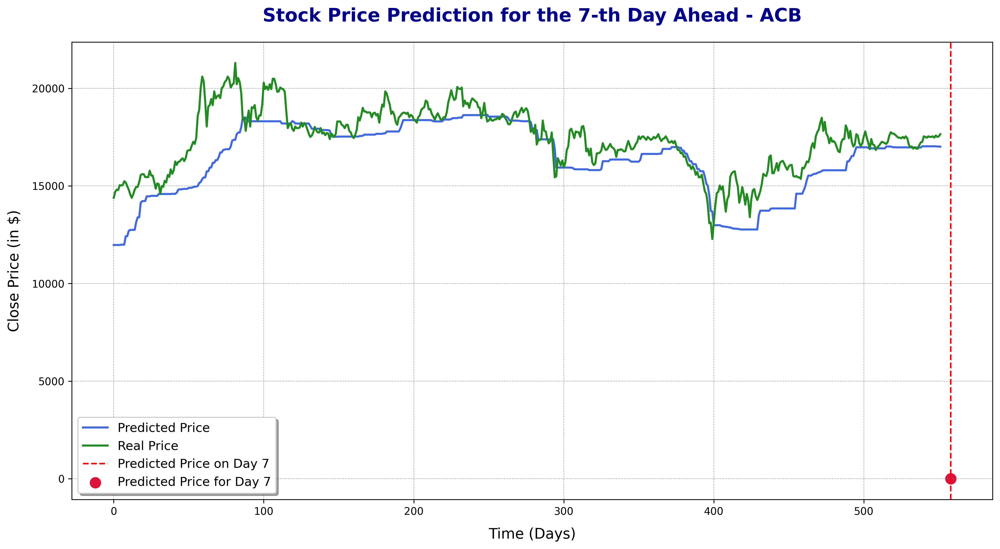

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.1549 - mse: 0.1549 - val_loss: 0.1530 - val_mse: 0.1530
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 760ms/step - loss: 0.1203 - mse: 0.1203 - val_loss: 0.1466 - val_mse: 0.1466
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 760ms/step - loss: 0.1192 - mse: 0.1192 - val_loss: 0.1455 - val_mse: 0.1455
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.1137 - mse: 0.1137 - val_loss: 0.1471 - val_mse: 0.1471
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 757ms/step - loss: 0.1166 - mse: 0.1166 - val_loss: 0.1390 - val_mse: 0.1390
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 756ms/step - loss: 0.1114 - mse: 0.1114 - val_loss: 0.1320 - val_mse: 0.1320
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.1226 - mse: 0.1226 - val_loss: 0.1326 - val_mse: 0.1326
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 764ms/step - loss: 0.1082 - mse: 0.1082 - val_loss: 0.1278 - val_mse: 0.1278
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 764ms/step - loss: 0.1008 - mse: 0.1008 - val_loss: 0

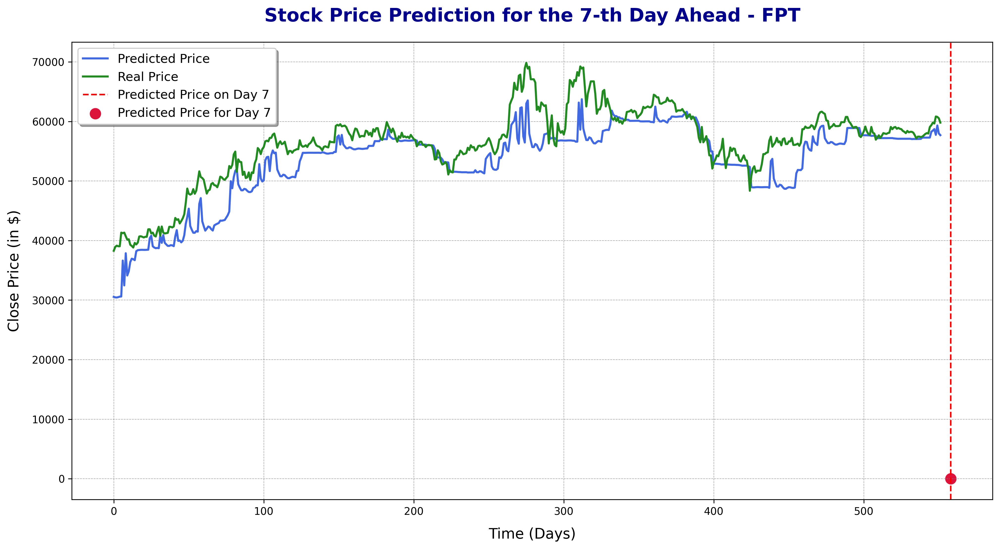

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1396, 30, 1)
y_train_norm shape:  (1396, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.1677 - mse: 0.1677 - val_loss: 0.1486 - val_mse: 0.1486
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 824ms/step - loss: 0.1498 - mse: 0.1498 - val_loss: 0.1367 - val_mse: 0.1367
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 833ms/step - loss: 0.1350 - mse: 0.1350 - val_loss: 0.1372 - val_mse: 0.1372
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.1311 - mse: 0.1311 - val_loss: 0.1343 - val_mse: 0.1343
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 822ms/step - loss: 0.1268 - mse: 0.1268 - val_loss: 0.1346 - val_mse: 0.1346
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 833ms/step - loss: 0.1261 - mse: 0.1261 - val_loss: 0.1349 - val_mse: 0.1349
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 839ms/step - loss: 0.1253 - mse: 0.1253 - val_loss: 0.1324 - val_mse: 0.1324
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.1260 - mse: 0.1260 - val_loss: 0.1311 - val_mse: 0.1311
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 830ms/step - loss: 0.1232 - mse: 0.1232 - val_loss: 0

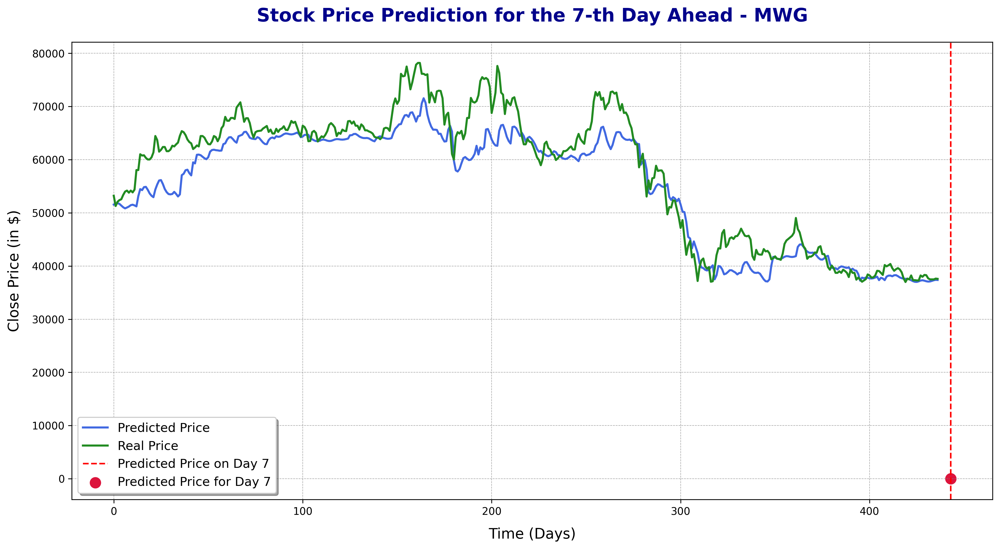

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1374, 30, 1)
y_train_norm shape:  (1374, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.1368 - mse: 0.1368 - val_loss: 0.2286 - val_mse: 0.2286
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.0853 - mse: 0.0853 - val_loss: 0.2799 - val_mse: 0.2799
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 820ms/step - loss: 0.0740 - mse: 0.0740 - val_loss: 0.2378 - val_mse: 0.2378
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 814ms/step - loss: 0.0806 - mse: 0.0806 - val_loss: 0.2695 - val_mse: 0.2695
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 827ms/step - loss: 0.0770 - mse: 0.0770 - val_loss: 0.2533 - val_mse: 0.2533
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.0775 - mse: 0.0775 - val_loss: 0.2406 - val_mse: 0.2406
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 812ms/step - loss: 0.0745 - mse: 0.0745 - val_loss: 0.2496 - val_mse: 0.2496
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 817ms/step - loss: 0.0807 - mse: 0.0807 - val_loss: 0.2555 - val_mse: 0.2555
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 827ms/step - loss: 0.0705 - mse: 0.0705 - val_loss: 0

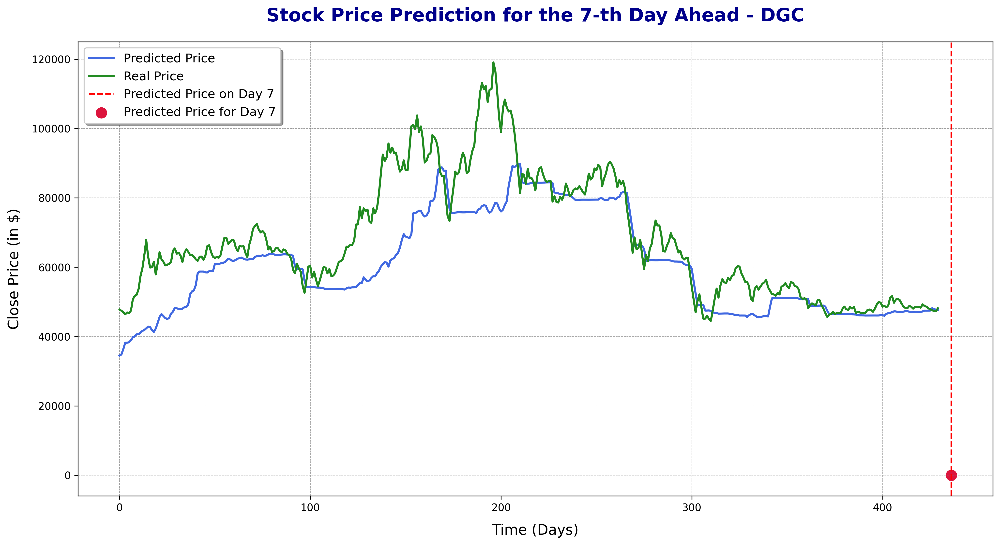

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.1184 - mse: 0.1184 - val_loss: 0.1134 - val_mse: 0.1134
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 788ms/step - loss: 0.1179 - mse: 0.1179 - val_loss: 0.1027 - val_mse: 0.1027
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 785ms/step - loss: 0.0959 - mse: 0.0959 - val_loss: 0.1013 - val_mse: 0.1013
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0904 - mse: 0.0904 - val_loss: 0.1014 - val_mse: 0.1014
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 794ms/step - loss: 0.0892 - mse: 0.0892 - val_loss: 0.1014 - val_mse: 0.1014
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 783ms/step - loss: 0.0885 - mse: 0.0885 - val_loss: 0.0989 - val_mse: 0.0989
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.0893 - mse: 0.0893 - val_loss: 0.1014 - val_mse: 0.1014
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 789ms/step - loss: 0.0885 - mse: 0.0885 - val_loss: 0.0934 - val_mse: 0.0934
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 799ms/step - loss: 0.0857 - mse: 0.0857 - val_loss: 

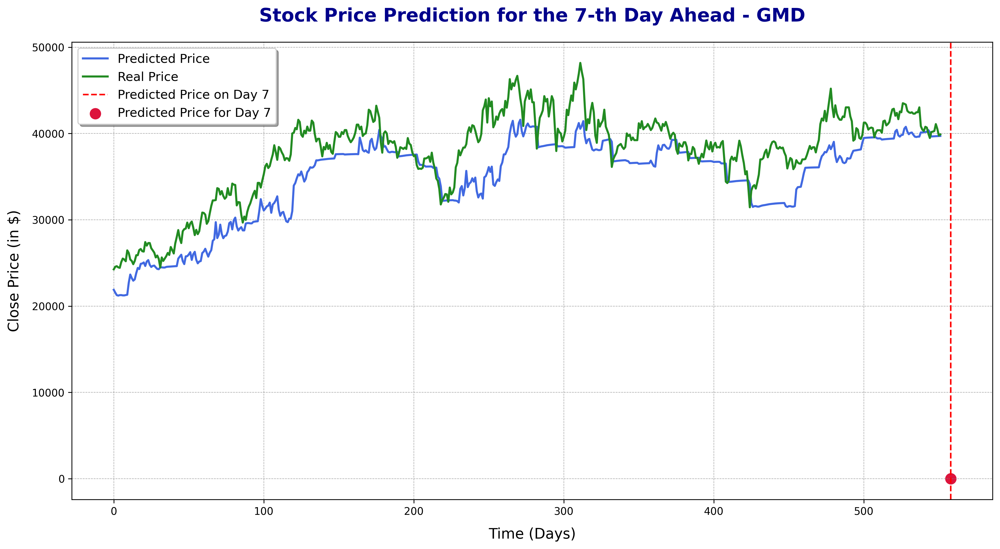

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 955ms/step - loss: 0.1196 - mse: 0.1196 - val_loss: 0.1291 - val_mse: 0.1291
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.0846 - mse: 0.0846 - val_loss: 0.1225 - val_mse: 0.1225
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 823ms/step - loss: 0.0778 - mse: 0.0778 - val_loss: 0.1301 - val_mse: 0.1301
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 794ms/step - loss: 0.0735 - mse: 0.0735 - val_loss: 0.1162 - val_mse: 0.1162
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.0806 - mse: 0.0806 - val_loss: 0.1192 - val_mse: 0.1192
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 778ms/step - loss: 0.0768 - mse: 0.0768 - val_loss: 0.1123 - val_mse: 0.1123
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 784ms/step - loss: 0.0714 - mse: 0.0714 - val_loss: 0.1028 - val_mse: 0.1028
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.0713 - mse: 0.0713 - val_loss: 0.0981 - val_mse: 0.0981
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 786ms/step - loss: 0.0654 - mse: 0.0654 - 

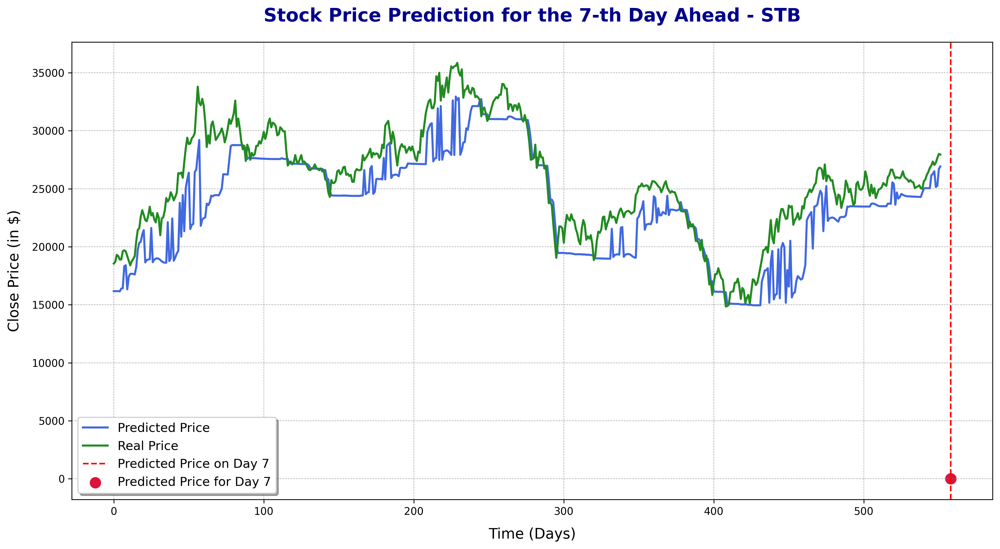

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.1149 - mse: 0.1149 - val_loss: 0.1232 - val_mse: 0.1232
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 795ms/step - loss: 0.1051 - mse: 0.1051 - val_loss: 0.1184 - val_mse: 0.1184
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 980ms/step - loss: 0.0914 - mse: 0.0914 - val_loss: 0.1144 - val_mse: 0.1144
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0924 - mse: 0.0924 - val_loss: 0.1135 - val_mse: 0.1135
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 783ms/step - loss: 0.0920 - mse: 0.0920 - val_loss: 0.1151 - val_mse: 0.1151
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 906ms/step - loss: 0.0937 - mse: 0.0937 - val_loss: 0.1081 - val_mse: 0.1081
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 782ms/step - loss: 0.0949 - mse: 0.0949 - val_loss: 0.1073 - val_mse: 0.1073
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 779ms/step - loss: 0.0903 - mse: 0.0903 - val_loss: 0.1061 - val_mse: 0.1061
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.0862 - mse: 0.0862 - val_loss: 

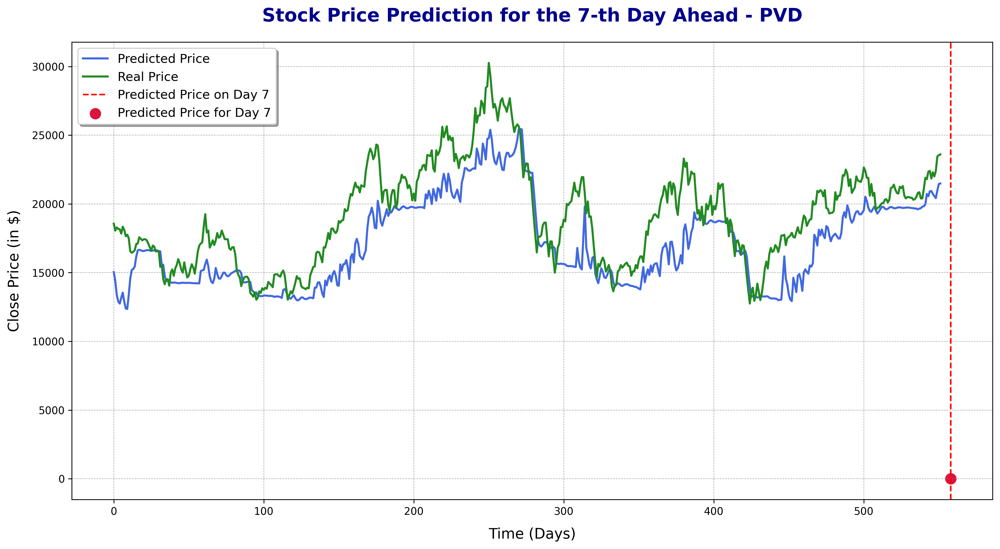

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1763, 30, 1)
y_train_norm shape:  (1763, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.2241 - mse: 0.2241 - val_loss: 0.1574 - val_mse: 0.1574
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.1504 - mse: 0.1504 - val_loss: 0.1663 - val_mse: 0.1663
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 790ms/step - loss: 0.1524 - mse: 0.1524 - val_loss: 0.1510 - val_mse: 0.1510
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 801ms/step - loss: 0.1436 - mse: 0.1436 - val_loss: 0.1489 - val_mse: 0.1489
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.1344 - mse: 0.1344 - val_loss: 0.1417 - val_mse: 0.1417
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 788ms/step - loss: 0.1246 - mse: 0.1246 - val_loss: 0.1495 - val_mse: 0.1495
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 809ms/step - loss: 0.1245 - mse: 0.1245 - val_loss: 0.1257 - val_mse: 0.1257
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.1086 - mse: 0.1086 - val_loss: 0.1169 - val_mse: 0.1169
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 808ms/step - loss: 0.1054 - mse: 0.1054 - val_loss: 0.1

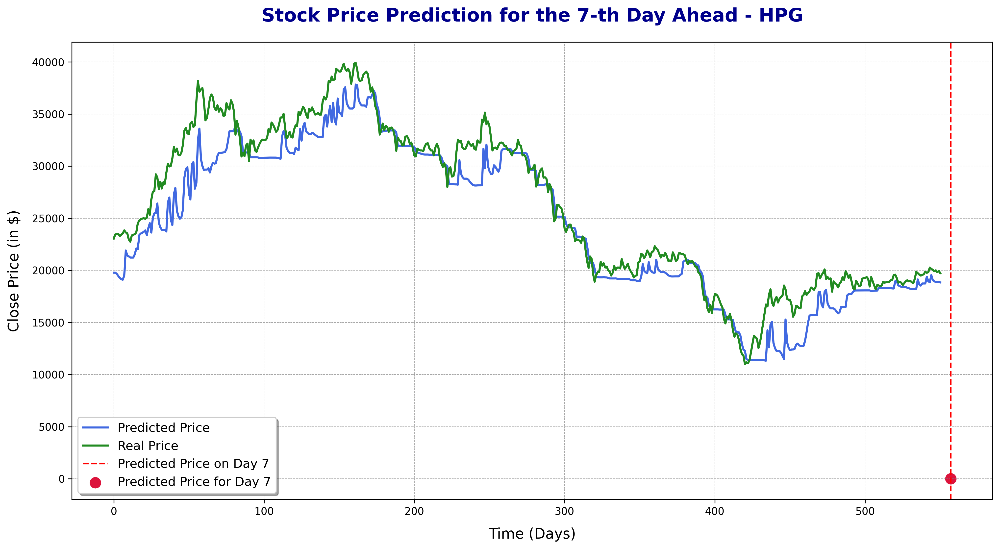

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.1612 - mse: 0.1612 - val_loss: 0.1463 - val_mse: 0.1463
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 819ms/step - loss: 0.1771 - mse: 0.1771 - val_loss: 0.1143 - val_mse: 0.1143
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 805ms/step - loss: 0.1375 - mse: 0.1375 - val_loss: 0.1088 - val_mse: 0.1088
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.1332 - mse: 0.1332 - val_loss: 0.1076 - val_mse: 0.1076
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 795ms/step - loss: 0.1415 - mse: 0.1415 - val_loss: 0.1106 - val_mse: 0.1106
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 801ms/step - loss: 0.1268 - mse: 0.1268 - val_loss: 0.1055 - val_mse: 0.1055
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.1270 - mse: 0.1270 - val_loss: 0.1048 - val_mse: 0.1048
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 800ms/step - loss: 0.1252 - mse: 0.1252 - val_loss: 0.1040 - val_mse: 0.1040
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 811ms/step - loss: 0.1194 - mse: 0.1194 - val_loss: 

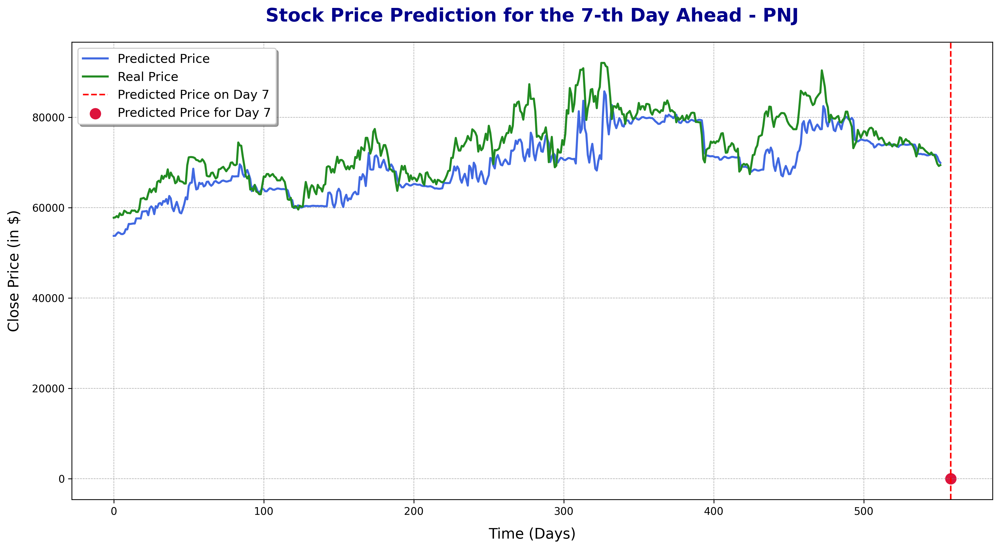

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.1411 - mse: 0.1411 - val_loss: 0.1575 - val_mse: 0.1575
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.1058 - mse: 0.1058 - val_loss: 0.1504 - val_mse: 0.1504
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 813ms/step - loss: 0.0976 - mse: 0.0976 - val_loss: 0.1491 - val_mse: 0.1491
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 819ms/step - loss: 0.1019 - mse: 0.1019 - val_loss: 0.1462 - val_mse: 0.1462
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.0972 - mse: 0.0972 - val_loss: 0.1419 - val_mse: 0.1419
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 819ms/step - loss: 0.0888 - mse: 0.0888 - val_loss: 0.1300 - val_mse: 0.1300
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 826ms/step - loss: 0.0853 - mse: 0.0853 - val_loss: 0.1163 - val_mse: 0.1163
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.0757 - mse: 0.0757 - val_loss: 0.1145 - val_mse: 0.1145
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 825ms/step - loss: 0.0694 - mse: 0.0694 - val

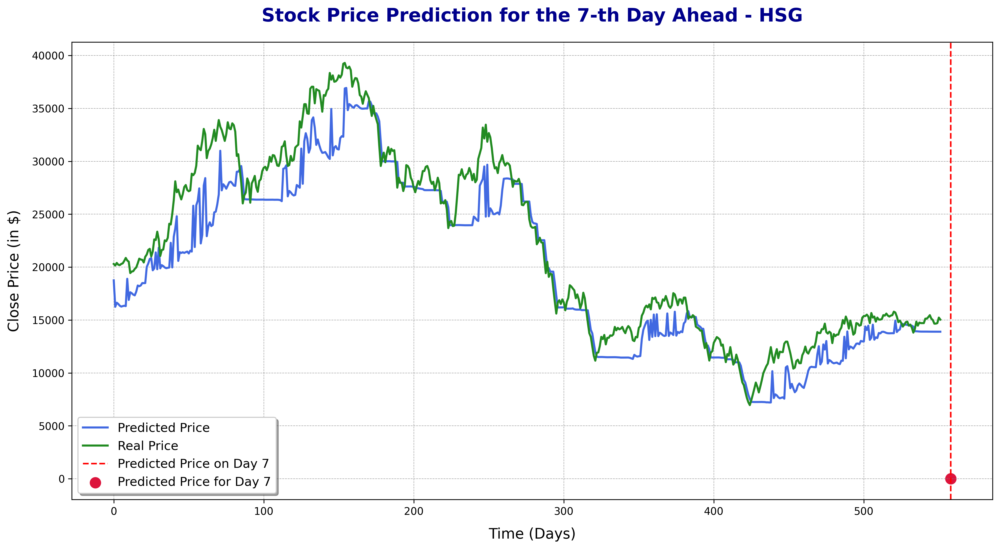

In [ ]:
for i in range(min(len(stock_code),10)):
  window_size=30
  company_data = company[i] # company is a list, you need to select element i (a dataframe) from it.
  k = 7
  kth_day(stock_code[i], company_data, window_size, k) # Changed 'company' to 'company_data' to pass the dataframe to the kth_day function

**k-consecutive day**

In [ ]:
def consecutive_days(company_data, window_size, model, X_predict, X_predict_norm, k):
    # Ensure that the model can predict multiple steps ahead
    predictions = []

    # Loop to predict k days ahead
    for i in range(k):
        # Get prediction
        y_pred_norm = model.predict(X_predict_norm)
        predictions.append(y_pred_norm[0])  # Collect the prediction

        # Prepare the next input based on the current prediction
        y_pred_reshaped = np.zeros((1, 1, X_predict_norm.shape[2]))  # Create a new array with the same feature size
        y_pred_reshaped[0, 0, :1] = y_pred_norm  # Fill only the first feature with the prediction

        # Concatenate the latest prediction as the new input
        X_predict_norm = np.concatenate((X_predict_norm[:, 1:, :], y_pred_reshaped), axis=1)  # Shift the window

    predictions = np.array(predictions).flatten()  # Flatten to 1D array for easier access

    return predictions  # Return all predictions for analysis

In [ ]:
def kth_consecutive(company, company_data, window_size, k):
    X_data = []
    y_data = []

    ### Split the dataset into time windows to get data samples.
    split_into_windows(company_data, window_size, X_data, y_data)

    ### Train-Val-Test Split
    X_train, y_train, X_val, y_val, X_test, y_test = train_val_test_split(X_data, y_data, window_size)

    ### Normalizing training and validation data
    X_train_norm, y_train_norm, X_val_norm, y_val_norm = normalize(X_train, y_train, X_val, y_val)
    print("X_train_norm shape: ", X_train_norm.shape)
    print("y_train_norm shape: ", y_train_norm.shape)

    ### Create and train the model
    model = build_model(window_size)

    # Compile and train the model with Mean Squared Error loss function
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mse', metrics=['mse'])
    history = model.fit(X_train_norm, y_train_norm, validation_data=(X_val_norm, y_val_norm), epochs=10, batch_size=512)

    ### Normalizing test data
    X_test_norm = MinMaxScaling(X_test)
    y_test_norm = y_test.copy()
    for i in range(len(X_test)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_test_norm[i] = (y_test[i] - min_feature) / (max_feature - min_feature)

    ### Get prediction on the test data and convert the result back to stock price (i.e., de-normalization)
    y_pred_norm = model.predict(X_test_norm)
    print("MSE on the test set: ", mean_squared_error(y_pred_norm, y_test_norm))

    # Convert the result back to stock price (i.e., denormalization) for visualization purpose
    y_pred_denorm = np.zeros_like(y_pred_norm)  # Prepare an array for denormalized predictions
    for i in range(len(y_pred_denorm)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_pred_denorm[i] = y_pred_norm[i] * (max_feature - min_feature) + min_feature

    ### Prediction for k-th day
    try:
        X_predict, X_predict_norm = features_prediction(company_data, window_size)
    except Exception as e:
        print("Error generating features for prediction:", e)

    # Predicting prices for k consecutive days
    kth_day_stock_prices = predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k)
    print("Prediction process done!")

    # Visualize predicted stock price versus real stock price
    plt.figure(figsize=(16, 8), dpi=300)

    # Define the x-axis for predicted and real prices
    days_range = np.arange(len(y_pred_denorm))  # x-axis for predicted prices
    real_days_range = np.arange(len(y_test))  # x-axis for real prices

    # Plot the predicted prices
    plt.plot(days_range, y_pred_denorm, label='Predicted Price', color='royalblue', linewidth=2)

    # Plot the real prices (up to the length of predictions)
    plt.plot(real_days_range, y_test[:len(y_pred_denorm)], label='Real Price', color='forestgreen', linewidth=2)

    # Annotate and mark the k-th day predictions
    for i in range(k):
        predicted_day_index = len(y_pred_denorm) + i  # Index for the k-th day
        # Access the predicted price correctly
        predicted_price = kth_day_stock_prices[i] if np.ndim(kth_day_stock_prices) == 1 else kth_day_stock_prices[i][0]
        plt.scatter(predicted_day_index, predicted_price, color='crimson', s=100, label=f'Day {i+1} Prediction')
        plt.annotate(f'${predicted_price:.2f}',
                    xy=(predicted_day_index, predicted_price),
                    xytext=(predicted_day_index + 1, predicted_price + 5),  # Adjust text position
                    arrowprops=dict(facecolor='black', arrowstyle='->'),
                    fontsize=12,
                    color='darkred')

    # Add a vertical dashed line for the k-th prediction point
    plt.axvline(x=len(y_pred_denorm) + k - 1, color='red', linestyle='--', linewidth=1.5, label=f'Forecast Point (Day {k})')

    # Add titles and labels
    plt.title(f'Stock Price Prediction for the Next {k} Days - {company}', fontsize=18, weight='bold', pad=20)
    plt.xlabel('Time (Days)', fontsize=14, labelpad=10)
    plt.ylabel('Close Price (in $)', fontsize=14, labelpad=10)

    # Add gridlines for better readability
    plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

    # Add a legend with a shadow for visual appeal
    plt.legend(fontsize=12, loc='best', frameon=True, fancybox=True, shadow=True)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

X_train_norm shape:  (1763, 30, 1)
y_train_norm shape:  (1763, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.1631 - mse: 0.1631 - val_loss: 0.2274 - val_mse: 0.2274
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 814ms/step - loss: 0.1436 - mse: 0.1436 - val_loss: 0.1830 - val_mse: 0.1830
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 764ms/step - loss: 0.1204 - mse: 0.1204 - val_loss: 0.2227 - val_mse: 0.2227
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.1313 - mse: 0.1313 - val_loss: 0.1839 - val_mse: 0.1839
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 771ms/step - loss: 0.1276 - mse: 0.1276 - val_loss: 0.1730 - val_mse: 0.1730
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 765ms/step - loss: 0.1185 - mse: 0.1185 - val_loss: 0.1707 - val_mse: 0.1707
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 763ms/step - loss: 0.1203 - mse: 0.1203 - val_loss: 0.1751 - val_mse: 0.1751
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 775ms/step - loss: 0.1144 - mse: 0.1144 - val_loss: 0.1718 - val_mse: 0.1718
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 864ms/step - loss: 0.1173 - mse: 0.1173 - val_loss

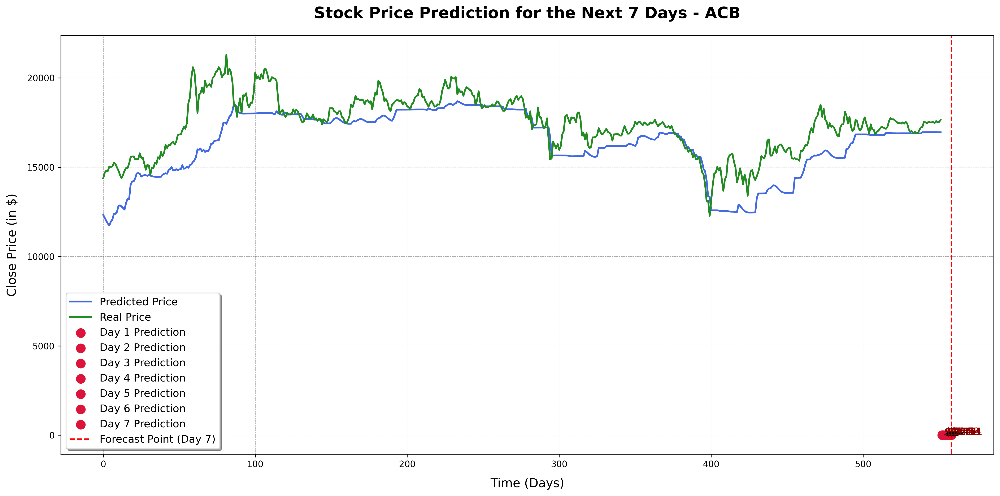

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 974ms/step - loss: 0.1641 - mse: 0.1641 - val_loss: 0.1632 - val_mse: 0.1632
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 776ms/step - loss: 0.1305 - mse: 0.1305 - val_loss: 0.1576 - val_mse: 0.1576
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.1257 - mse: 0.1257 - val_loss: 0.1487 - val_mse: 0.1487
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 762ms/step - loss: 0.1160 - mse: 0.1160 - val_loss: 0.1545 - val_mse: 0.1545
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 766ms/step - loss: 0.1162 - mse: 0.1162 - val_loss: 0.1446 - val_mse: 0.1446
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.1133 - mse: 0.1133 - val_loss: 0.1445 - val_mse: 0.1445
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 766ms/step - loss: 0.1164 - mse: 0.1164 - val_loss: 0.1468 - val_mse: 0.1468
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 775ms/step - loss: 0.1167 - mse: 0.1167 - val_loss: 0.1477 - val_mse: 0.1477
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.1191 - mse: 0.1191 - val_loss: 0

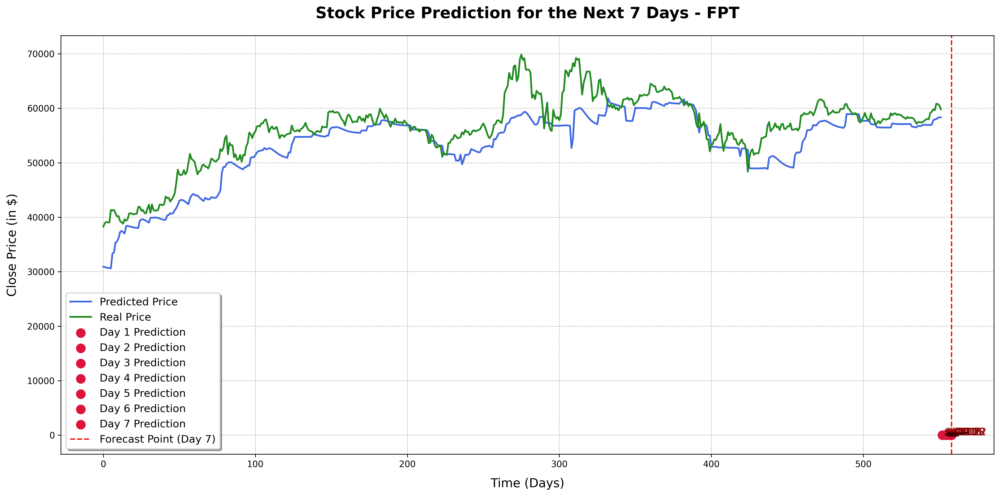

X_train_norm shape:  (1396, 30, 1)
y_train_norm shape:  (1396, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.1924 - mse: 0.1924 - val_loss: 0.1347 - val_mse: 0.1347
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 841ms/step - loss: 0.1335 - mse: 0.1335 - val_loss: 0.1406 - val_mse: 0.1406
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.1300 - mse: 0.1300 - val_loss: 0.1339 - val_mse: 0.1339
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 834ms/step - loss: 0.1270 - mse: 0.1270 - val_loss: 0.1316 - val_mse: 0.1316
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 821ms/step - loss: 0.1313 - mse: 0.1313 - val_loss: 0.1298 - val_mse: 0.1298
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 837ms/step - loss: 0.1292 - mse: 0.1292 - val_loss: 0.1285 - val_mse: 0.1285
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.1225 - mse: 0.1225 - val_loss: 0.1230 - val_mse: 0.1230
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 826ms/step - loss: 0.1117 - mse: 0.1117 - val_loss: 0.1200 - val_mse: 0.1200
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 836ms/step - loss: 0.1166 - mse: 0.1166 - 

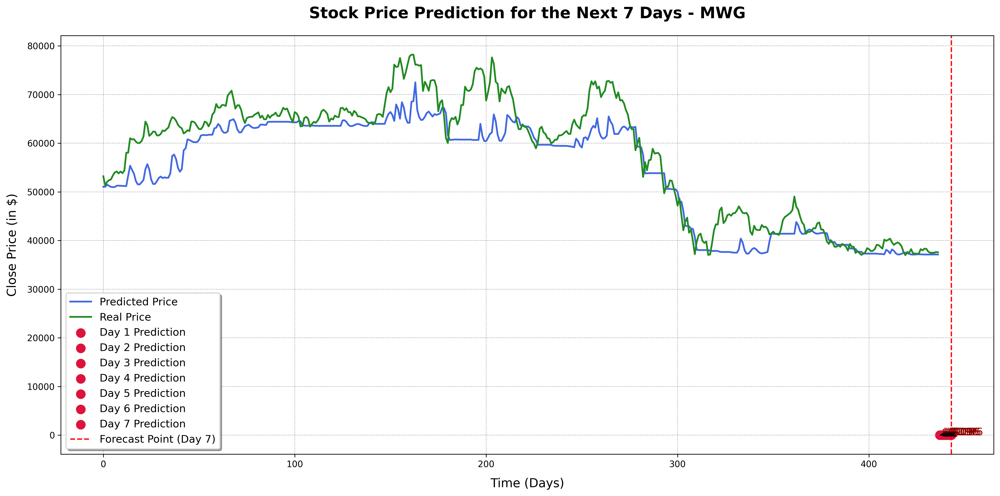

X_train_norm shape:  (1374, 30, 1)
y_train_norm shape:  (1374, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.1584 - mse: 0.1584 - val_loss: 0.2423 - val_mse: 0.2423
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 813ms/step - loss: 0.0841 - mse: 0.0841 - val_loss: 0.2855 - val_mse: 0.2855
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 830ms/step - loss: 0.0800 - mse: 0.0800 - val_loss: 0.2378 - val_mse: 0.2378
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 821ms/step - loss: 0.0777 - mse: 0.0777 - val_loss: 0.2563 - val_mse: 0.2563
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - loss: 0.0768 - mse: 0.0768 - val_loss: 0.2528 - val_mse: 0.2528
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 833ms/step - loss: 0.0747 - mse: 0.0747 - val_loss: 0.2358 - val_mse: 0.2358
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 826ms/step - loss: 0.0735 - mse: 0.0735 - val_loss: 0.2431 - val_mse: 0.2431
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 819ms/step - loss: 0.0683 - mse: 0.0683 - val_loss: 0.2166 - val_mse: 0.2166
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.0745 - mse: 0.0745 - val_loss: 0

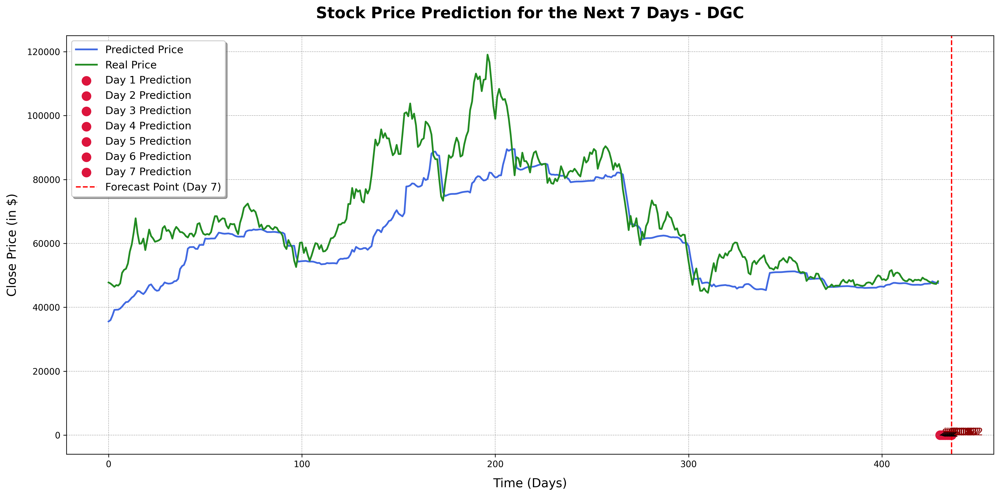

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 958ms/step - loss: 0.1409 - mse: 0.1409 - val_loss: 0.1040 - val_mse: 0.1040
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.0967 - mse: 0.0967 - val_loss: 0.1016 - val_mse: 0.1016
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 803ms/step - loss: 0.0920 - mse: 0.0920 - val_loss: 0.1025 - val_mse: 0.1025
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 793ms/step - loss: 0.0914 - mse: 0.0914 - val_loss: 0.1004 - val_mse: 0.1004
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.0883 - mse: 0.0883 - val_loss: 0.0987 - val_mse: 0.0987
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 788ms/step - loss: 0.0939 - mse: 0.0939 - val_loss: 0.0969 - val_mse: 0.0969
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 793ms/step - loss: 0.0937 - mse: 0.0937 - val_loss: 0.0908 - val_mse: 0.0908
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.0804 - mse: 0.0804 - val_loss: 0.0923 - val_mse: 0.0923
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 790ms/step - loss: 0.0801 - mse: 0.0801 -

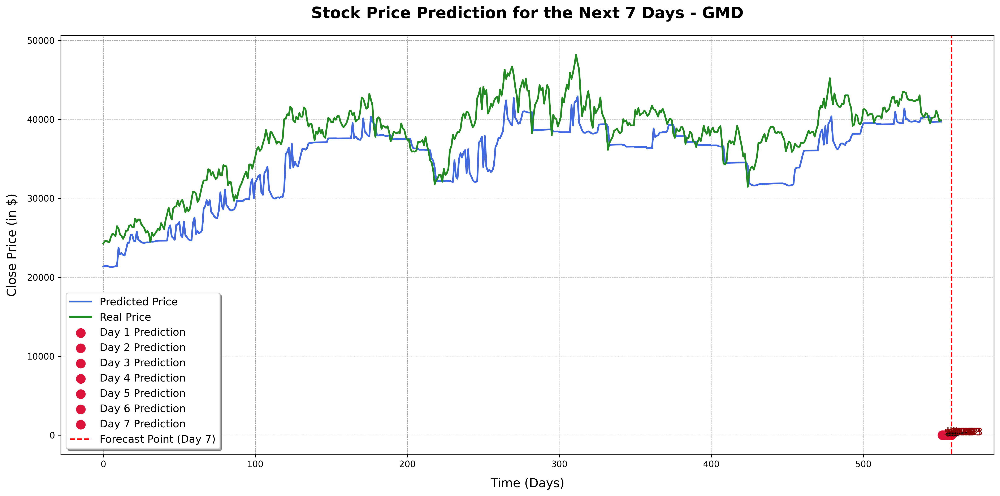

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.1131 - mse: 0.1131 - val_loss: 0.1297 - val_mse: 0.1297
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 811ms/step - loss: 0.0880 - mse: 0.0880 - val_loss: 0.1197 - val_mse: 0.1197
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 896ms/step - loss: 0.0802 - mse: 0.0802 - val_loss: 0.1186 - val_mse: 0.1186
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 782ms/step - loss: 0.0739 - mse: 0.0739 - val_loss: 0.1214 - val_mse: 0.1214
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 828ms/step - loss: 0.0743 - mse: 0.0743 - val_loss: 0.1175 - val_mse: 0.1175
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 781ms/step - loss: 0.0757 - mse: 0.0757 - val_loss: 0.1199 - val_mse: 0.1199
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 790ms/step - loss: 0.0745 - mse: 0.0745 - val_loss: 0.1131 - val_mse: 0.1131
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.0710 - mse: 0.0710 - val_loss: 0.1066 - val_mse: 0.1066
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 792ms/step - loss: 0.0708 - mse: 0.0708 - val_los

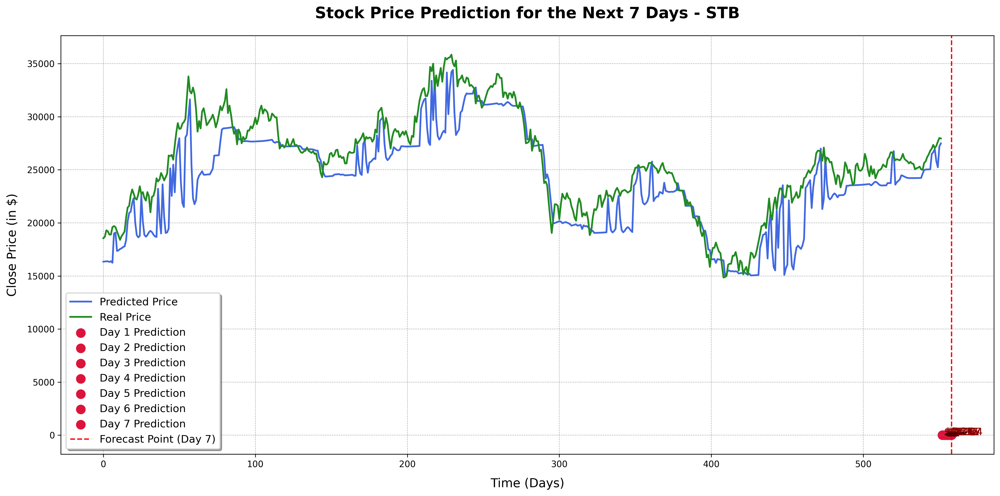

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.1160 - mse: 0.1160 - val_loss: 0.1243 - val_mse: 0.1243
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 827ms/step - loss: 0.1700 - mse: 0.1700 - val_loss: 0.1163 - val_mse: 0.1163
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.0939 - mse: 0.0939 - val_loss: 0.1152 - val_mse: 0.1152
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 807ms/step - loss: 0.0965 - mse: 0.0965 - val_loss: 0.1174 - val_mse: 0.1174
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 800ms/step - loss: 0.0876 - mse: 0.0876 - val_loss: 0.1143 - val_mse: 0.1143
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.0970 - mse: 0.0970 - val_loss: 0.1200 - val_mse: 0.1200
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 801ms/step - loss: 0.0950 - mse: 0.0950 - val_loss: 0.1128 - val_mse: 0.1128
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 885ms/step - loss: 0.0910 - mse: 0.0910 - val_loss: 0.1127 - val_mse: 0.1127
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 799ms/step - loss: 0.0855 - mse: 0.0855 - val_loss: 

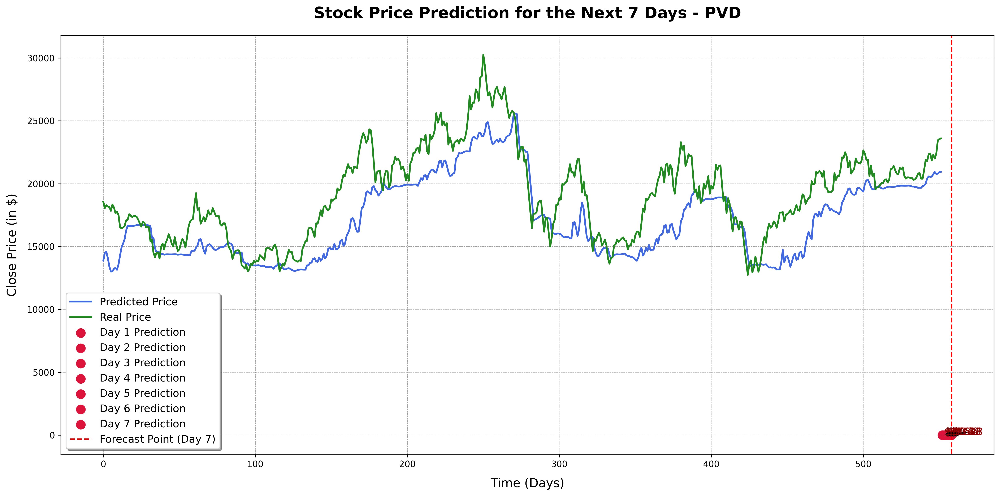

X_train_norm shape:  (1763, 30, 1)
y_train_norm shape:  (1763, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.1764 - mse: 0.1764 - val_loss: 0.1961 - val_mse: 0.1961
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 913ms/step - loss: 0.1688 - mse: 0.1688 - val_loss: 0.1535 - val_mse: 0.1535
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 806ms/step - loss: 0.1397 - mse: 0.1397 - val_loss: 0.1522 - val_mse: 0.1522
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 816ms/step - loss: 0.1373 - mse: 0.1373 - val_loss: 0.1537 - val_mse: 0.1537
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.1424 - mse: 0.1424 - val_loss: 0.1497 - val_mse: 0.1497
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 809ms/step - loss: 0.1326 - mse: 0.1326 - val_loss: 0.1451 - val_mse: 0.1451
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 819ms/step - loss: 0.1280 - mse: 0.1280 - val_loss: 0.1341 - val_mse: 0.1341
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 816ms/step - loss: 0.1180 - mse: 0.1180 - val_loss: 0.1241 - val_mse: 0.1241
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 821ms/step - loss: 0.1079 - mse: 0.1079 - val_loss

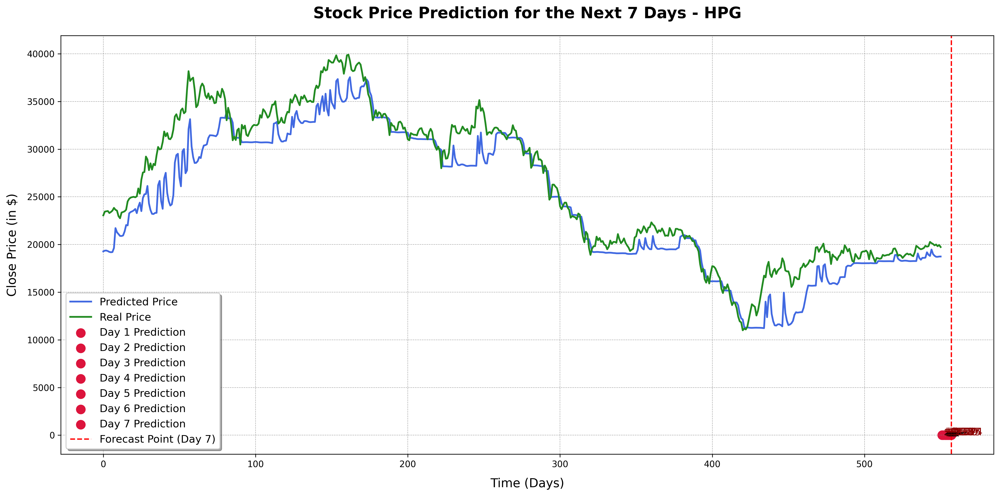

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.1858 - mse: 0.1858 - val_loss: 0.1144 - val_mse: 0.1144
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 825ms/step - loss: 0.1333 - mse: 0.1333 - val_loss: 0.1068 - val_mse: 0.1068
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 839ms/step - loss: 0.1399 - mse: 0.1399 - val_loss: 0.1075 - val_mse: 0.1075
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 808ms/step - loss: 0.1248 - mse: 0.1248 - val_loss: 0.1130 - val_mse: 0.1130
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 818ms/step - loss: 0.1279 - mse: 0.1279 - val_loss: 0.1059 - val_mse: 0.1059
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.1297 - mse: 0.1297 - val_loss: 0.1044 - val_mse: 0.1044
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 806ms/step - loss: 0.1215 - mse: 0.1215 - val_loss: 0.0987 - val_mse: 0.0987
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 815ms/step - loss: 0.1167 - mse: 0.1167 - val_loss: 0.0997 - val_mse: 0.0997
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.1128 - mse: 0.1128 - val_loss: 

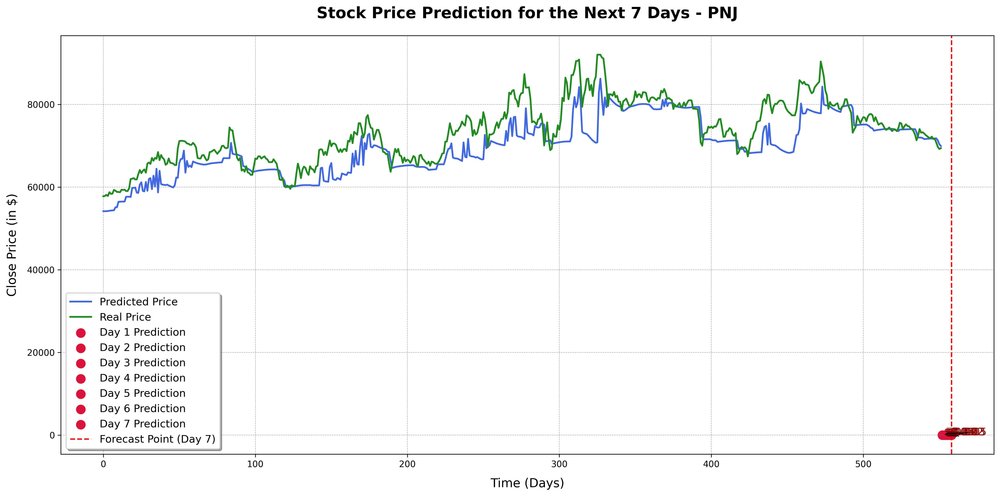

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)
Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


4/4 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 0.1308 - mse: 0.1308 - val_loss: 0.2276 - val_mse: 0.2276
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 839ms/step - loss: 0.2339 - mse: 0.2339 - val_loss: 0.1529 - val_mse: 0.1529
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 837ms/step - loss: 0.1011 - mse: 0.1011 - val_loss: 0.1513 - val_mse: 0.1513
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 903ms/step - loss: 0.1026 - mse: 0.1026 - val_loss: 0.1530 - val_mse: 0.1530
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.1026 - mse: 0.1026 - val_loss: 0.1541 - val_mse: 0.1541
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 846ms/step - loss: 0.0982 - mse: 0.0982 - val_loss: 0.1453 - val_mse: 0.1453
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 828ms/step - loss: 0.1035 - mse: 0.1035 - val_loss: 0.1576 - val_mse: 0.1576
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.1026 - mse: 0.1026 - val_loss: 0.1450 - val_mse: 0.1450
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 837ms/step - loss: 0.1008 - mse: 0.1008 - val_loss: 

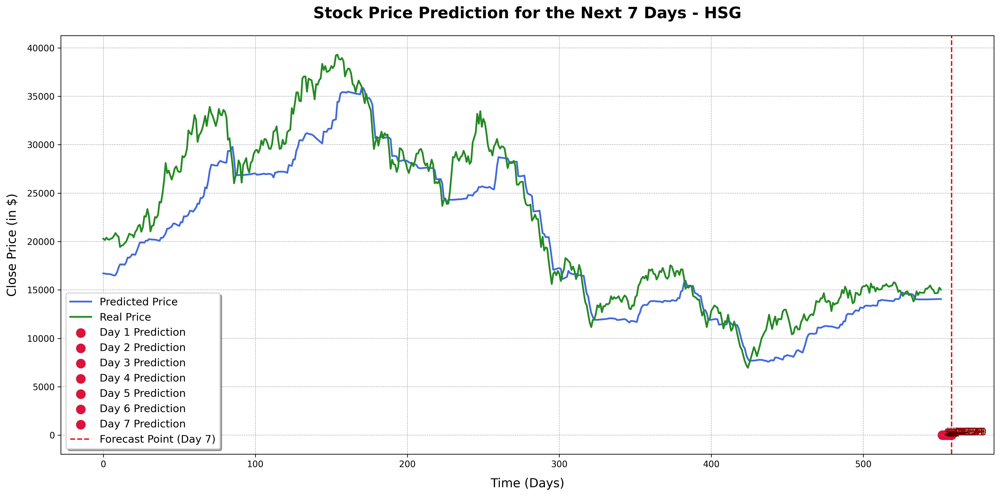

In [ ]:
for i in range(min(len(stock_code),10)):
  window_size=30
  company_data = company[i] # company is a list, you need to select element i (a dataframe) from it.
  k = 7
  kth_consecutive(stock_code[i], company_data, window_size, k) # Changed 'company' to 'company_data' to pass the dataframe to the kth_day function


**Calling Point Prediction - Putting Point Prediction**

In [ ]:
data = company[1:10].copy()
data

[            time   open   high    low  close   volume ticker
 0     2012-03-20   6000   6000   5960   5960    94310    FPT
 1     2012-03-21   5960   6000   5910   5960   145260    FPT
 2     2012-03-22   5960   5960   5860   5860    90050    FPT
 3     2012-03-23   5910   5910   5860   5910    71320    FPT
 4     2012-03-26   5910   5910   5860   5910   112360    FPT
 ...          ...    ...    ...    ...    ...      ...    ...
 2785  2023-05-18  60020  60900  59730  60830  1373800    FPT
 2786  2023-05-19  60900  61120  60020  60760   979100    FPT
 2787  2023-05-22  60760  60760  60170  60530   530200    FPT
 2788  2023-05-23  60530  60530  59730  59800   599900    FPT
 2789  2023-05-24  60170  60240  59500  59650   464300    FPT
 
 [2790 rows x 7 columns],
             time   open   high    low  close   volume ticker
 0     2014-07-14   4330   4360   4330   4360    10660    MWG
 1     2014-07-15   4640   4640   4640   4640    13480    MWG
 2     2014-07-16   4960   4960   4960   4

In [166]:
window = 30

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Assuming 'company' is a list of Pandas DataFrames
# Select the first DataFrame from the list (you might need to adjust the index if needed)
company_df = company[1]

# Select only the numeric columns from the DataFrame
data = company_df[['open', 'high', 'low', 'close']]  # Adjust based on your actual numeric column names

# Normalize the data using MinMaxScaler
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)

# Split the data into training and testing sets
train_data, test_data = train_test_split(scaled_data, test_size=0.2, shuffle=False)

print("Training data shape:", train_data.shape)
print("Testing data shape:", test_data.shape)

Training data shape: (2232, 4)
Testing data shape: (558, 4)


In [ ]:
data['difference'] = data['close'] - data['open']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [170]:
# Define thresholds for price change
buy_threshold = 0.02
sell_threshold = -0.02

# Generate labels based on price change
price_change = data['close'].pct_change()
labels = np.zeros_like(price_change)
labels[price_change > buy_threshold] = 1  # Buy
labels[price_change < sell_threshold] = -1  # Sell

In [171]:
from keras.utils import to_categorical

# Convert labels to one-hot encoding
labels = np.where(labels == 1, 1, 0)  # Convert 1s and -1s to 0s and 1s
labels = to_categorical(labels, num_classes=3)  # One-hot encode (0, 1, 2)

# Split the data into training and testing sets
train_data, test_data = train_test_split(scaled_data, test_size=0.2, shuffle=False)

# Prepare the training data
X_train = []
y_train = []

for i in range(window, len(train_data)):
    X_train.append(train_data[i-window:i, :])  # Using all features
    y_train.append(labels[i])  # Labels should be aligned with output

X_train, y_train = np.array(X_train), np.array(y_train)

# Train-test split for training data
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=False)


In [173]:
# Define the model architecture
model = Sequential()
model.add(LSTM(64, input_shape=(window, 4)))  # 4 features: open, high, low, close
model.add(Dense(3, activation='softmax'))  # 3 classes for buy, sell, hold
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
              loss='mse', metrics=['mse'])


In [174]:
# Train the model
history = model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs=10, batch_size=1024)

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 696ms/step - loss: 0.1958 - mse: 0.1958 - val_loss: 0.1367 - val_mse: 0.1367
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.1206 - mse: 0.1206 - val_loss: 0.0949 - val_mse: 0.0949
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - loss: 0.0781 - mse: 0.0781 - val_loss: 0.0761 - val_mse: 0.0761
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.0568 - mse: 0.0568 - val_loss: 0.0701 - val_mse: 0.0701
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0516 - mse: 0.0516 - val_loss: 0.0689 - val_mse: 0.0689
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0491 - mse: 0.0491 - val_loss: 0.0691 - val_mse: 0.0691
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0482 - mse: 0.0482 - val_loss: 0.0697 - val_mse: 0.0697
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 178ms/step - loss: 0.0455 - mse: 0.0455 - val_loss: 0.0702 - val_mse: 0.0702
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0464 - mse: 

In [175]:
# Prepare the testing data
X_test = []
y_test = []

for i in range(window, len(test_data)):
    X_test.append(test_data[i-window:i, 0:])
    y_test.append(labels[i])

X_test, y_test = np.array(X_test), np.array(y_test)

# Evaluate the model
y_pred = model.predict(X_test)
print("MSE on the test set: ", mean_squared_error(y_pred, y_test))

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
MSE on the test set:  0.059353045666738914


In [176]:
for i in range(len(y_pred)):
  if (max(y_pred[i]) == y_pred[i][0]):
    y_pred[i] = -1
  elif (max(y_pred[i] == y_pred[i][1])):
    y_pred[i] = 0
  else:
    y_pred[i] = 1

In [179]:
y_pred[5]

array([-1., -1., -1.], dtype=float32)

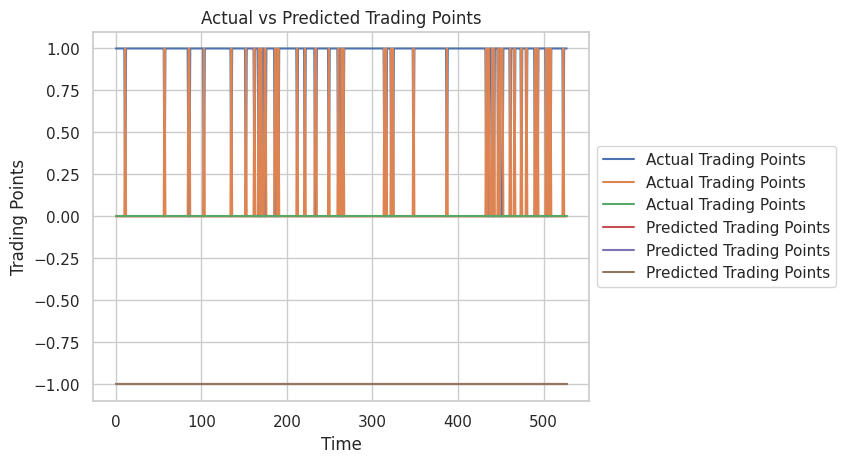

In [188]:
# Plotting the actual trading points
plt.plot(y_test, label='Actual Trading Points')

# Plotting the predicted trading points
plt.plot(y_pred, label='Predicted Trading Points')

plt.xlabel('Time')
plt.ylabel('Trading Points')
plt.title('Actual vs Predicted Trading Points')
# plt.legend()
# legend on the right
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [194]:
#save the model so I won't have to rerun model to tune the other sections
from tensorflow.keras.models import save_model
save_model(model, "model.h5")


In [198]:
#import pre-saved model
from tensorflow import keras
from tensorflow.keras.models import load_model
# Explicitly import mse from tensorflow.keras.losses
from tensorflow.keras.losses import mse

# Load the model using keras instead of tensorflow.keras
model = keras.models.load_model('/content/model.h5', custom_objects={'mse': mse})

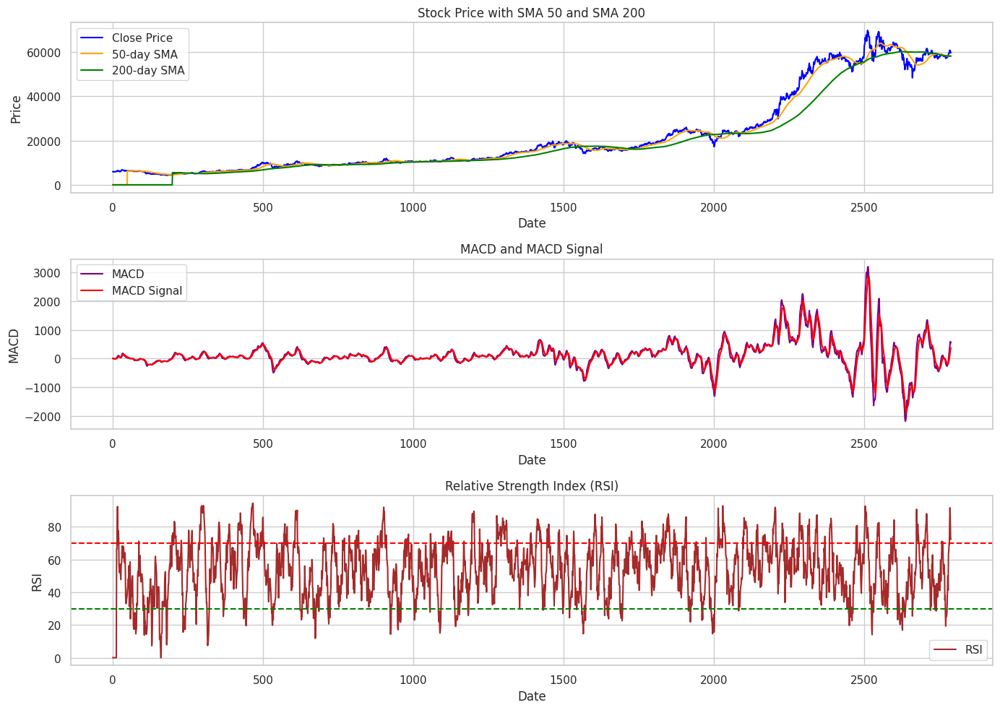

In [193]:
def add_technical_indicators(data):
    """
    Adds SMA, MACD, and RSI to the data.
    :param data: DataFrame with stock prices, must include 'close' column.
    :return: DataFrame with added technical indicators.
    """
    # Ensure data is a DataFrame
    if not isinstance(data, pd.DataFrame):
        data = pd.DataFrame(data)

    # Simple Moving Averages (SMA)
    data['SMA_50'] = data['close'].rolling(window=50).mean()
    data['SMA_200'] = data['close'].rolling(window=200).mean()

    # MACD - Using typical values for short-term (12), long-term (26), and signal (9)
    short_ema = data['close'].ewm(span=12, adjust=False).mean()
    long_ema = data['close'].ewm(span=26, adjust=False).mean()
    data['MACD'] = short_ema - long_ema
    data['MACD_Signal'] = data['MACD'].ewm(span=9, adjust=False).mean()

    # Relative Strength Index (RSI)
    delta = data['close'].diff(1)
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    avg_gain = pd.Series(gain).rolling(window=14).mean()
    avg_loss = pd.Series(loss).rolling(window=14).mean()
    rs = avg_gain / avg_loss
    data['RSI'] = 100 - (100 / (1 + rs))

    # Fill any remaining NaN values
    data.fillna(0, inplace=True)

    return data

def visualize_technical_indicators(data):
    """
    Visualizes the SMA, MACD, and RSI indicators.
    :param data: DataFrame with stock prices and technical indicators.
    """
    plt.figure(figsize=(14, 10))

    # Plot Closing Price, SMA 50, and SMA 200
    plt.subplot(3, 1, 1)
    plt.plot(data.index, data['close'], label='Close Price', color='blue')
    plt.plot(data.index, data['SMA_50'], label='50-day SMA', color='orange')
    plt.plot(data.index, data['SMA_200'], label='200-day SMA', color='green')
    plt.title('Stock Price with SMA 50 and SMA 200')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()

    # Plot MACD and MACD Signal
    plt.subplot(3, 1, 2)
    plt.plot(data.index, data['MACD'], label='MACD', color='purple')
    plt.plot(data.index, data['MACD_Signal'], label='MACD Signal', color='red')
    plt.title('MACD and MACD Signal')
    plt.xlabel('Date')
    plt.ylabel('MACD')
    plt.legend()

    # Plot RSI
    plt.subplot(3, 1, 3)
    plt.plot(data.index, data['RSI'], label='RSI', color='brown')
    plt.axhline(70, color='red', linestyle='--')
    plt.axhline(30, color='green', linestyle='--')
    plt.title('Relative Strength Index (RSI)')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example usage
# Add SMA, MACD, and RSI to your data
company_data = company[1]  #test with fpt
company_data = add_technical_indicators(company_data)

# Visualize the technical indicators
visualize_technical_indicators(company_data)


**Selling Point**

In [206]:
def predict_sell_point(data, buy_price):
    """
    Identifies the best selling point for a stock and provides a probability score for selling.
    :param data: DataFrame containing stock data with columns 'open', 'high', 'low', 'close'
    :param buy_price: The price at which the stock was bought
    :param model_path: Path to the saved model file
    """
    # Load the saved model
    model = load_model('/content/model.h5', compile=False)

    # Recompile the model to avoid warnings
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

    window = 120  # Look-back period for past prices

    # Get the price data from the past 'window' days (using the 'open' price)
    # Assuming your model was trained with 'open', 'high', 'low', 'close' features
    predict_data = data[['open', 'high', 'low', 'close']].iloc[-window:].values
    predict_data = predict_data.reshape(1, window, predict_data.shape[1]) # Reshape to (1, 120, 4)

    # Normalize the data
    predict_data_norm = predict_data.copy()
    for i in range(len(predict_data)):
        min_feature = np.min(predict_data[i], axis=0) # Normalize across features
        max_feature = np.max(predict_data[i], axis=0) # Normalize across features
        predict_data_norm[i] = (predict_data[i] - min_feature) / (max_feature - min_feature)

    # Predict prices one week into the future
    predict = model.predict(predict_data_norm)
#
    # Debugging: Print predicted normalized values
    print(f"Predicted Normalized Prices: {predict}")

    # De-normalize the predicted values
    predict_denorm = predict.copy()
    for i in range(len(predict_denorm)):  # denorm_x = norm_x * (max(x) - min(x)) + min(x)
        min_feature = np.min(predict_data[i])
        max_feature = np.max(predict_data[i])
        predict_denorm[i] = predict[i] * (max_feature - min_feature) + min_feature

    # Debugging: Print de-normalized predicted prices
    print(f"Predicted De-normalized Prices: {predict_denorm.flatten()}")

    # Get the maximum predicted price
    max_value = np.max(predict_denorm)

    # Calculate selling probability based on predicted maximum price vs. buy price
    probability_sell = (max_value / buy_price) - 1  # Higher probability if predicted price is much higher

    # Debugging: Print the maximum predicted value and selling probability
    print(f"Max Predicted Price: {max_value}")
    print(f"Selling Probability: {probability_sell}")

    # Selling decision logic
    stock_ticker = data['ticker'].iloc[0]  # Assuming 'ticker' column exists
    if max_value > buy_price:
        days_to_sell = list(predict_denorm.flatten()).index(max_value) + 1
        percentage_increase = ((max_value / buy_price) - 1) * 100
        print(f"Stock Ticker: {stock_ticker}")
        print(f"You should consider selling the stock in the next {days_to_sell} days. "
              f"The stock price will increase by {percentage_increase:.2f}% compared to your buy price. "
              f"The highest stock price in the next week is {max_value:.2f}.")
        print(f"Selling Probability: {probability_sell:.2f}")
    else:
        print(f"Stock Ticker: {stock_ticker}")
        print("You should consider not selling the stock in the next week as the price is expected to decrease. "
              f"The highest stock price in the next week is {max_value:.2f}.")
        print(f"Selling Probability: {probability_sell:.2f}")


example when to sell a stock

In [207]:
#example with FPT stock
data = company[1].copy()

In [208]:
buy_price = 50000
predict_sell_point(data, buy_price)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
Predicted Normalized Prices: [[0.39030525 0.30547446 0.30422035]]
Predicted De-normalized Prices: [56828.156 56006.992 55994.85 ]
Max Predicted Price: 56828.15625
Selling Probability: 0.1365631249999999
Stock Ticker: FPT
You should consider selling the stock in the next 1 days. The stock price will increase by 13.66% compared to your buy price. The highest stock price in the next week is 56828.16.
Selling Probability: 0.14


In [211]:
# #mwg stock
data = company[2].copy()
buy_price = 35000
predict_sell_point(data, buy_price)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
Predicted Normalized Prices: [[0.39030525 0.30547446 0.30422035]]
Predicted De-normalized Prices: [41607.82  40573.734 40558.445]
Max Predicted Price: 41607.8203125
Selling Probability: 0.18879486607142848
Stock Ticker: MWG
You should consider selling the stock in the next 1 days. The stock price will increase by 18.88% compared to your buy price. The highest stock price in the next week is 41607.82.
Selling Probability: 0.19


**Buying Point**

In [219]:
def predict_buy_point(data, current_price):

    """
    Identifies the best buying point for a stock and provides a probability score for buying.
    :param data: DataFrame containing stock data with columns 'open', 'high', 'low', 'close'
    :param current_price: The current price of the stock
    """

    # Load the saved model
    model = load_model('/content/model.h5', compile=False)

    # Recompile the model to avoid warnings
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

    window = 120  # Look-back period for past prices

    # Ensure data has at least the required window size
    if len(data) < window:
        print(f"Error: Not enough data for the required window size of {window} days.")
        return

    # Get the price data from the past 'window' days (using 'open', 'high', 'low', 'close' prices)
    # Assuming your model expects 4 features
    predict_data = data[['open', 'high', 'low', 'close']].iloc[-window:].values.reshape(1, window, 4)

    # Normalize the data
    predict_data_norm = predict_data.copy()
    for i in range(len(predict_data)):
        min_feature = np.min(predict_data[i])
        max_feature = np.max(predict_data[i])
        predict_data_norm[i] = (predict_data[i] - min_feature) / (max_feature - min_feature)

    # Predict prices one week into the future
    predict = model.predict(predict_data_norm)

    # Debugging: Print predicted normalized prices
    print(f"Predicted Normalized Prices: {predict}")

    # De-normalize the predicted values
    predict_denorm = predict.copy()
    for i in range(len(predict_denorm)):  # denorm_x = norm_x * (max(x) - min(x)) + min(x)
        min_feature = np.min(predict_data[i])
        max_feature = np.max(predict_data[i])
        predict_denorm[i] = predict[i] * (max_feature - min_feature) + min_feature

    # Debugging: Print de-normalized predicted prices
    print(f"Predicted De-normalized Prices: {predict_denorm.flatten()}")

    # Get the minimum predicted price
    min_value = np.min(predict_denorm)

    # Calculate buying probability based on predicted minimum price vs. current price
    probability_buy = max(0, 1 - (min_value / current_price))  # Ensure probability is not negative

    # Debugging: Print the minimum predicted value and buying probability
    print(f"Min Predicted Price: {min_value}")
    print(f"Buying Probability: {probability_buy}")

    # Buying decision logic
    stock_ticker = data['ticker'].iloc[0]  # Assuming 'ticker' column exists
    if min_value < current_price:
        days_to_buy = list(predict_denorm.flatten()).index(min_value) + 1
        percentage_decrease = ((current_price / min_value) - 1) * 100
        print(f"Stock Ticker: {stock_ticker}")
        print(f"You should consider buying the stock in the next {days_to_buy} days. "
              f"The stock price will decrease by {percentage_decrease:.2f}% compared to now. "
              f"The lowest stock price in the next week is {min_value:.2f}.")
        print(f"Buying Probability: {probability_buy:.2f}")
    else:
        print(f"Stock Ticker: {stock_ticker}")
        print("You should consider not buying the stock in the next week as the price is expected to increase. "
              f"The lowest stock price in the next week is {min_value:.2f}.")
        print(f"Buying Probability: {probability_buy:.2f}")


In [220]:
# #example with #GMD stock
data = company[4].copy()
buy_price = 50000
predict_buy_point(data, buy_price)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
Predicted Normalized Prices: [[0.39030525 0.30547446 0.30422035]]
Predicted De-normalized Prices: [39316.445 38497.83  38485.727]
Min Predicted Price: 38485.7265625
Buying Probability: 0.23028546875
Stock Ticker: GMD
You should consider buying the stock in the next 3 days. The stock price will decrease by 29.92% compared to now. The lowest stock price in the next week is 38485.73.
Buying Probability: 0.23


In [233]:
#example with VHM stock
data = company[10].copy()
buy_price = 50000
predict_buy_point(data, buy_price)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
Predicted Normalized Prices: [[0.39030525 0.30547446 0.30422035]]
Predicted De-normalized Prices: [46776.77  45173.47  45149.766]
Min Predicted Price: 45149.765625
Buying Probability: 0.09700468750000002
Stock Ticker: VHM
You should consider buying the stock in the next 3 days. The stock price will decrease by 10.74% compared to now. The lowest stock price in the next week is 45149.77.
Buying Probability: 0.10


Portfolio Construction